#ResNet50

##Importing the Model

In [ ]:
# summarize filters in each convolutional layer
from tensorflow.keras.applications.resnet50 import ResNet50
from matplotlib import pyplot
# load the model
model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
# summarize the model
model.summary()


94765736/94765736 [==============================] - 0s 0us/step
Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_2[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                          

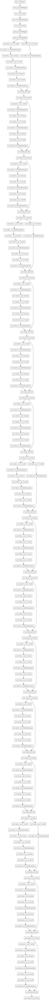

In [ ]:
from keras.utils import plot_model

plot_model(model)

##Get Layer Output

In [ ]:
#handling the error of having a non-convolutional layer
for i in range(len(model.layers)):
    # get filter weights
    try:
        filters, biases = model.layers[i].get_weights()
        print("layer number", i, model.layers[i].name, filters.shape)
    except ValueError:
        # layer does not have any weights
        continue

layer number 2 conv1_conv (7, 7, 3, 64)
layer number 7 conv2_block1_1_conv (1, 1, 64, 64)
layer number 10 conv2_block1_2_conv (3, 3, 64, 64)
layer number 13 conv2_block1_0_conv (1, 1, 64, 256)
layer number 14 conv2_block1_3_conv (1, 1, 64, 256)
layer number 19 conv2_block2_1_conv (1, 1, 256, 64)
layer number 22 conv2_block2_2_conv (3, 3, 64, 64)
layer number 25 conv2_block2_3_conv (1, 1, 64, 256)
layer number 29 conv2_block3_1_conv (1, 1, 256, 64)
layer number 32 conv2_block3_2_conv (3, 3, 64, 64)
layer number 35 conv2_block3_3_conv (1, 1, 64, 256)
layer number 39 conv3_block1_1_conv (1, 1, 256, 128)
layer number 42 conv3_block1_2_conv (3, 3, 128, 128)
layer number 45 conv3_block1_0_conv (1, 1, 256, 512)
layer number 46 conv3_block1_3_conv (1, 1, 128, 512)
layer number 51 conv3_block2_1_conv (1, 1, 512, 128)
layer number 54 conv3_block2_2_conv (3, 3, 128, 128)
layer number 57 conv3_block2_3_conv (1, 1, 128, 512)
layer number 61 conv3_block3_1_conv (1, 1, 512, 128)
layer number 64 conv3

In [ ]:
len(model.layers)

175

In [ ]:
# normalize filter values to 0-1 so we can visualize them
f_min, f_max = filters.min(), filters.max()
filters = (filters - f_min) / (f_max - f_min)

##Filter Visualization

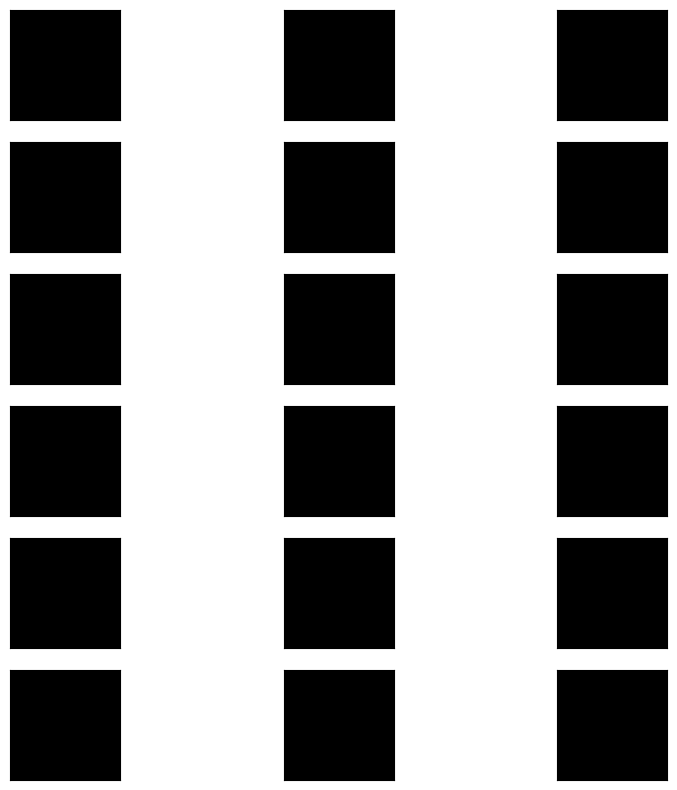

In [ ]:
# plot first few filters
n_filters, ix = 6, 1
fig = pyplot.figure(figsize=(10,10))
for i in range(n_filters):
	# get the filter
	f = filters[:, :, :, i]
	# plot each channel separately
	
	for j in range(3):
		# specify subplot and turn of axis
		ax = pyplot.subplot(n_filters, 3, ix)
		ax.set_xticks([])
		ax.set_yticks([])
		# plot filter channel in grayscale
		pyplot.imshow(f[:, :, j], cmap='gray')
		ix += 1
# show the figure
pyplot.show()


In [ ]:
fig = pyplot.figure(figsize=(10,10))
import matplotlib.pyplot as plt

#Iterate thru all the layers of the model
for layer in model.layers:
    try:
        weights, bias = layer.get_weights()
        print(layer.name, filters.shape)
    except ValueError:
        # layer does not have any weights
        continue
        
        #normalize filter values between  0 and 1 for visualization
        f_min, f_max = weights.min(), weights.max()
        filters = (weights - f_min) / (f_max - f_min)  
        print(filters.shape[3])
        filter_cnt=1
        n_filters=filters.shape[3]
        ix=1
        for i in range(n_filters):
          # get the filter
          f = filters[:, :, :, i]
          # plot each channel separately
          
          for j in range(3):
            # specify subplot and turn of axis
            ax = pyplot.subplot(n_filters, 3, ix)
            ax.set_xticks([])
            ax.set_yticks([])
            # plot filter channel in grayscale
            pyplot.imshow(f[:, :, j], cmap='gray')
            ix += 1
        # show the figure
        pyplot.show()


conv1_conv (1, 1, 512, 2048)
conv2_block1_1_conv (1, 1, 512, 2048)
conv2_block1_2_conv (1, 1, 512, 2048)
conv2_block1_0_conv (1, 1, 512, 2048)
conv2_block1_3_conv (1, 1, 512, 2048)
conv2_block2_1_conv (1, 1, 512, 2048)
conv2_block2_2_conv (1, 1, 512, 2048)
conv2_block2_3_conv (1, 1, 512, 2048)
conv2_block3_1_conv (1, 1, 512, 2048)
conv2_block3_2_conv (1, 1, 512, 2048)
conv2_block3_3_conv (1, 1, 512, 2048)
conv3_block1_1_conv (1, 1, 512, 2048)
conv3_block1_2_conv (1, 1, 512, 2048)
conv3_block1_0_conv (1, 1, 512, 2048)
conv3_block1_3_conv (1, 1, 512, 2048)
conv3_block2_1_conv (1, 1, 512, 2048)
conv3_block2_2_conv (1, 1, 512, 2048)
conv3_block2_3_conv (1, 1, 512, 2048)
conv3_block3_1_conv (1, 1, 512, 2048)
conv3_block3_2_conv (1, 1, 512, 2048)
conv3_block3_3_conv (1, 1, 512, 2048)
conv3_block4_1_conv (1, 1, 512, 2048)
conv3_block4_2_conv (1, 1, 512, 2048)
conv3_block4_3_conv (1, 1, 512, 2048)
conv4_block1_1_conv (1, 1, 512, 2048)
conv4_block1_2_conv (1, 1, 512, 2048)
conv4_block1_0_conv (

<Figure size 1000x1000 with 0 Axes>

## Image Visualization

## plot feature map of first conv layer for given image

In [ ]:
from keras.applications.resnet import preprocess_input
from tensorflow.keras.utils import load_img
from tensorflow.keras.utils import img_to_array
from keras.models import Model
from matplotlib import pyplot
from numpy import expand_dims

In [ ]:
model = Model(inputs=model.inputs , outputs=model.layers[1].output)

In [ ]:
image = load_img("/content/MediumFile.jpg" , target_size=(224,224))

# convert the image to an array
image = img_to_array(image)
# expand dimensions so that it represents a single 'sample'
image = expand_dims(image, axis=0)

image = preprocess_input(image)

1/1 [==============================] - 0s 192ms/step


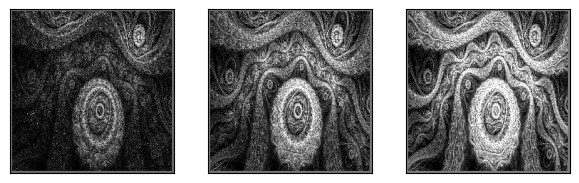

In [ ]:
#calculating features_map
features = model.predict(image)

fig = pyplot.figure(figsize=(20,20))
for i in range(1,features.shape[3]+1):

    ax =pyplot.subplot(8,8,i)
    ax.set_xticks([])
    ax.set_yticks([])
    pyplot.imshow(features[0,:,:,i-1] , cmap='gray')
    
pyplot.show()

## Plot feature map of layers 2,5,9,13,17 for given image

In [ ]:
model2 = ResNet50()
layer_index = [ 2, 5 , 9 , 13 , 17]
outputs = [model2.layers[i].output for i in layer_index]

model3 = Model( inputs= model2.inputs, outputs = outputs)

1/1 [==============================] - 0s 356ms/step


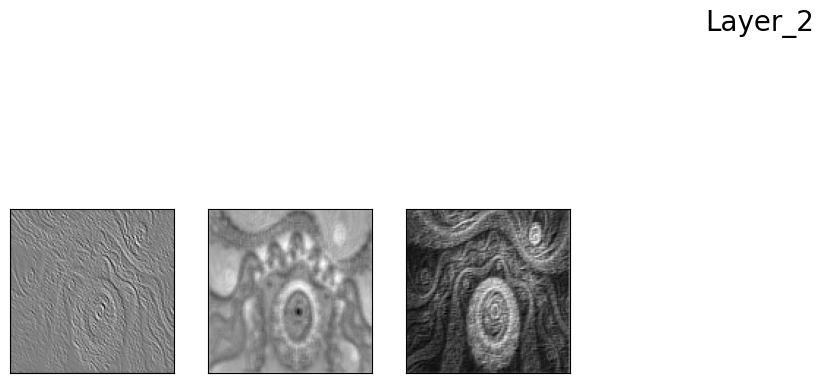

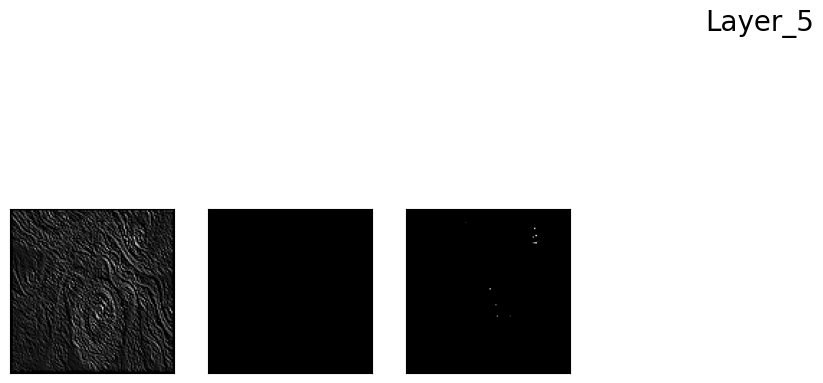

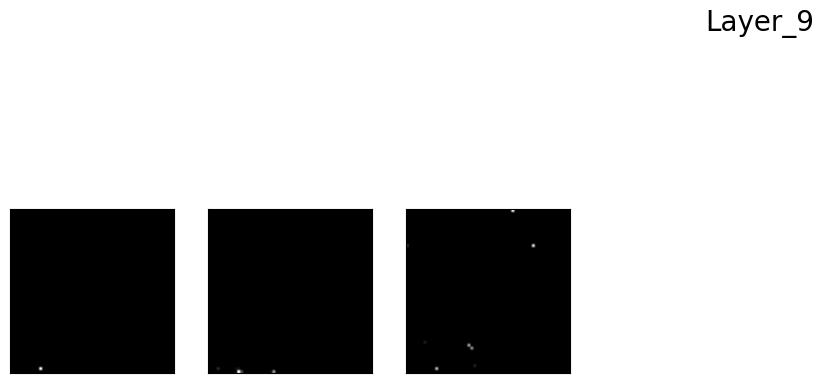

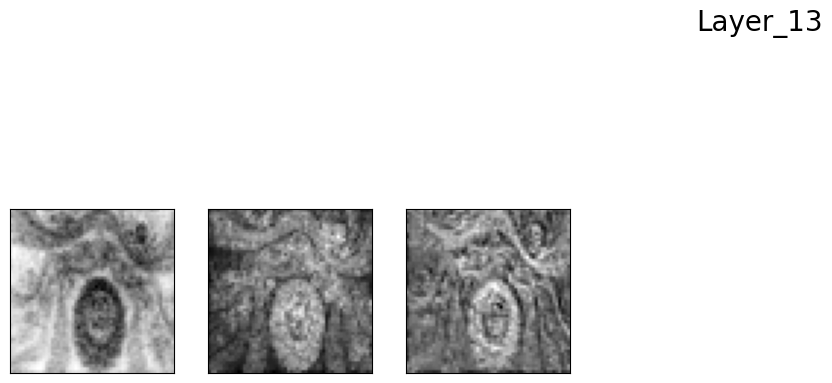

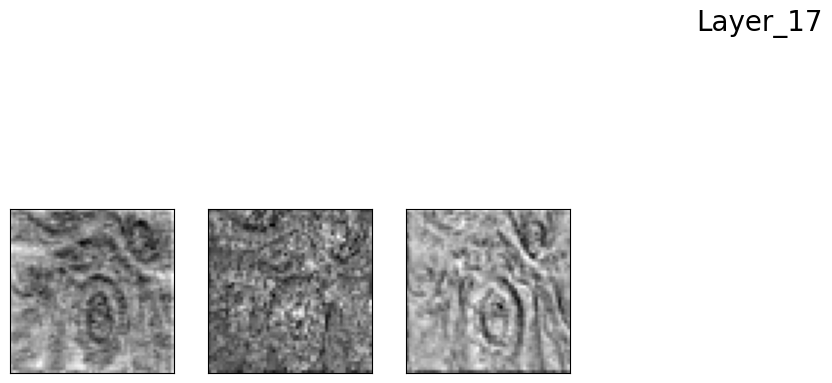

In [ ]:
feature_map = model3.predict(image)

for i,fmap in zip(layer_index,feature_map):
    fig = pyplot.figure(figsize=(20,20))
    fig.suptitle("Layer_{}".format(i) , fontsize=20)
    for i in range(1,features.shape[3]+1):

        ax=pyplot.subplot(8,8,i)
        ax.set_xticks([])
        ax.set_yticks([])
        pyplot.imshow(fmap[0,:,:,i-1] , cmap='gray')
    
pyplot.show()

##Obtain all intermediate representations for the image.

1/1 [==============================] - 2s 2s/step
(1, 230, 230, 3)
(1, 112, 112, 64)
(1, 112, 112, 64)
(1, 112, 112, 64)


<ipython-input-30-d7b3d86c3cfe>:38: RuntimeWarning: invalid value encountered in true_divide
  x /= x.std ()


(1, 114, 114, 64)
(1, 56, 56, 64)
(1, 56, 56, 64)
(1, 56, 56, 64)
(1, 56, 56, 64)
(1, 56, 56, 64)
(1, 56, 56, 64)
(1, 56, 56, 64)
(1, 56, 56, 256)
(1, 56, 56, 256)
(1, 56, 56, 256)
(1, 56, 56, 256)
(1, 56, 56, 256)
(1, 56, 56, 256)
(1, 56, 56, 64)
(1, 56, 56, 64)
(1, 56, 56, 64)
(1, 56, 56, 64)


<ipython-input-30-d7b3d86c3cfe>:46: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure( figsize=(scale * n_features, scale) )


(1, 56, 56, 64)
(1, 56, 56, 64)
(1, 56, 56, 256)
(1, 56, 56, 256)
(1, 56, 56, 256)
(1, 56, 56, 256)
(1, 56, 56, 64)
(1, 56, 56, 64)
(1, 56, 56, 64)
(1, 56, 56, 64)
(1, 56, 56, 64)
(1, 56, 56, 64)
(1, 56, 56, 256)
(1, 56, 56, 256)
(1, 56, 56, 256)
(1, 56, 56, 256)
(1, 28, 28, 128)
(1, 28, 28, 128)
(1, 28, 28, 128)
(1, 28, 28, 128)
(1, 28, 28, 128)
(1, 28, 28, 128)
(1, 28, 28, 512)
(1, 28, 28, 512)
(1, 28, 28, 512)
(1, 28, 28, 512)
(1, 28, 28, 512)
(1, 28, 28, 512)
(1, 28, 28, 128)
(1, 28, 28, 128)
(1, 28, 28, 128)
(1, 28, 28, 128)
(1, 28, 28, 128)
(1, 28, 28, 128)
(1, 28, 28, 512)
(1, 28, 28, 512)
(1, 28, 28, 512)
(1, 28, 28, 512)
(1, 28, 28, 128)
(1, 28, 28, 128)
(1, 28, 28, 128)
(1, 28, 28, 128)
(1, 28, 28, 128)
(1, 28, 28, 128)
(1, 28, 28, 512)
(1, 28, 28, 512)
(1, 28, 28, 512)
(1, 28, 28, 512)
(1, 28, 28, 128)
(1, 28, 28, 128)
(1, 28, 28, 128)
(1, 28, 28, 128)
(1, 28, 28, 128)
(1, 28, 28, 128)
(1, 28, 28, 512)
(1, 28, 28, 512)
(1, 28, 28, 512)
(1, 28, 28, 512)
(1, 14, 14, 256)
(1, 1

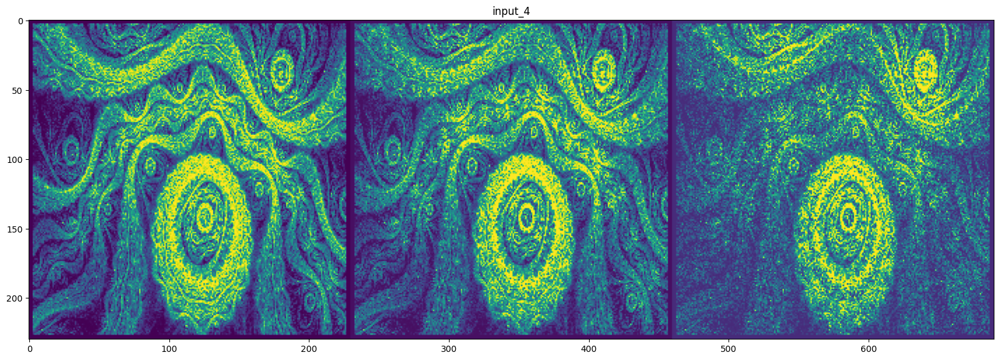

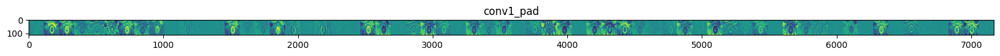

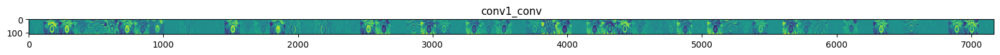

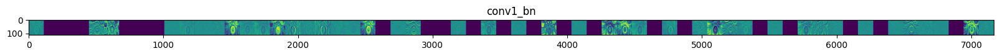

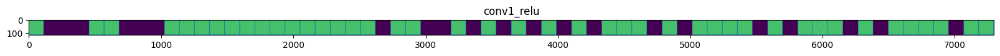

...

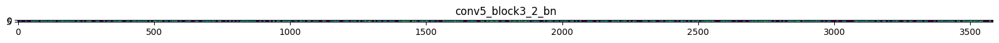

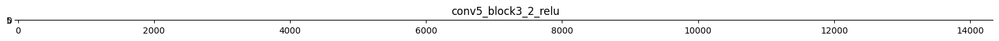

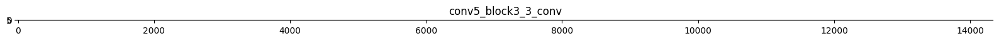

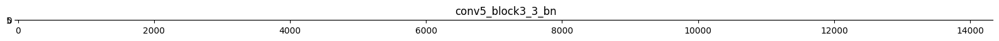

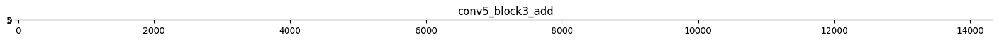

In [ ]:
import numpy as np
# load the model
model = ResNet50()
# Define a new Model, Input= image 
# Output= intermediate representations for all layers in the  
# previous model after the first.
successive_outputs = [layer.output for layer in model.layers[1:]]
#visualization_model = Model(img_input, successive_outputs)
visualization_model =Model(inputs = model.input, outputs = successive_outputs)
#Load the input image
img = load_img('/content/MediumFile.jpg', target_size=(224, 224))
# Convert ht image to Array of dimension (224,224,3)
x   = img_to_array(img)                           
x   = x.reshape((1,) + x.shape)
# Rescale by 1/255
x /= 255.0
# Let's run input image through our vislauization network
# to obtain all intermediate representations for the image.
successive_feature_maps = visualization_model.predict(x)
# Retrieve are the names of the layers, so can have them as part of our plot
layer_names = [layer.name for layer in model.layers]
for layer_name, feature_map in zip(layer_names, successive_feature_maps):
  print(feature_map.shape)
  if len(feature_map.shape) == 4:
    
    # Plot Feature maps for the conv / maxpool layers, not the fully-connected layers
   
    n_features = feature_map.shape[-1]  # number of features in the feature map
    size       = feature_map.shape[ 1]  # feature map shape (1, size, size, n_features)
    
    # We will tile our images in this matrix
    display_grid = np.zeros((size, size * n_features))
    
    # Postprocess the feature to be visually palatable
    for i in range(n_features):
      x  = feature_map[0, :, :, i]
      x -= x.mean()
      x /= x.std ()
      x *=  64
      x += 128
      x  = np.clip(x, 0, 255).astype('uint8')
      # Tile each filter into a horizontal grid
      display_grid[:, i * size : (i + 1) * size] = x
# Display the grid
    scale = 20. / n_features
    plt.figure( figsize=(scale * n_features, scale) )
    plt.title ( layer_name )
    plt.grid  ( False )
    plt.imshow( display_grid, aspect='auto', cmap='viridis' )


#FaceNet


##Import the Model

In [ ]:
# summarize filters in each convolutional layer
!pip install keras-facenet
from keras_facenet import FaceNet
from matplotlib import pyplot
# load the model
model = FaceNet()

model.build(input_shape=(None, 160, 160, 3))
model.summary()


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


ModuleNotFoundError: ignored

In [ ]:
from keras.utils import plot_model

plot_model(model, to_file='facenet_model.png', show_shapes=True, show_layer_names=True)

AttributeError: ignored

# 2-Get Layer Output

In [ ]:
# summarize filter shapes
for i in range(len(model.layers)):
	# check for convolutional layer
	if 'conv' not in model.layers[i].name:
		continue
	# get filter weights
	filters, biases = model.layers[i].get_weights()
	print("layer number",i,model.layers[i].name, filters.shape)

layer number 1 block1_conv1 (3, 3, 3, 64)
layer number 2 block1_conv2 (3, 3, 64, 64)
layer number 4 block2_conv1 (3, 3, 64, 128)
layer number 5 block2_conv2 (3, 3, 128, 128)
layer number 7 block3_conv1 (3, 3, 128, 256)
layer number 8 block3_conv2 (3, 3, 256, 256)
layer number 9 block3_conv3 (3, 3, 256, 256)
layer number 11 block4_conv1 (3, 3, 256, 512)
layer number 12 block4_conv2 (3, 3, 512, 512)
layer number 13 block4_conv3 (3, 3, 512, 512)
layer number 15 block5_conv1 (3, 3, 512, 512)
layer number 16 block5_conv2 (3, 3, 512, 512)
layer number 17 block5_conv3 (3, 3, 512, 512)


In [ ]:
# retrieve weights from the second hidden layer
filters, biases = model.layers[1].get_weights()
# print(filters, biases)


In [ ]:
# normalize filter values to 0-1 so we can visualize them
f_min, f_max = filters.min(), filters.max()
filters = (filters - f_min) / (f_max - f_min)

# 3-Filter Visualization

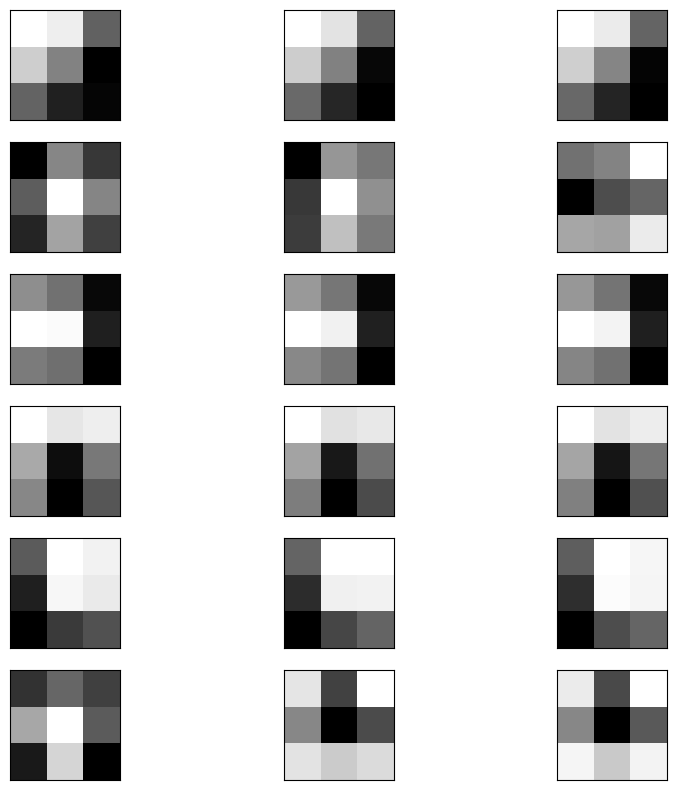

In [ ]:
# plot first few filters
n_filters, ix = 6, 1
fig = pyplot.figure(figsize=(10,10))
for i in range(n_filters):
	# get the filter
	f = filters[:, :, :, i]
	# plot each channel sep arately
	
	for j in range(3):
		# specify subplot and turn of axis
		ax = pyplot.subplot(n_filters, 3, ix)
		ax.set_xticks([])
		ax.set_yticks([])
		# plot filter channel in grayscale
		pyplot.imshow(f[:, :, j], cmap='gray')
		ix += 1
# show the figure
pyplot.show()


block1_conv1 (3, 3, 3, 64)
64


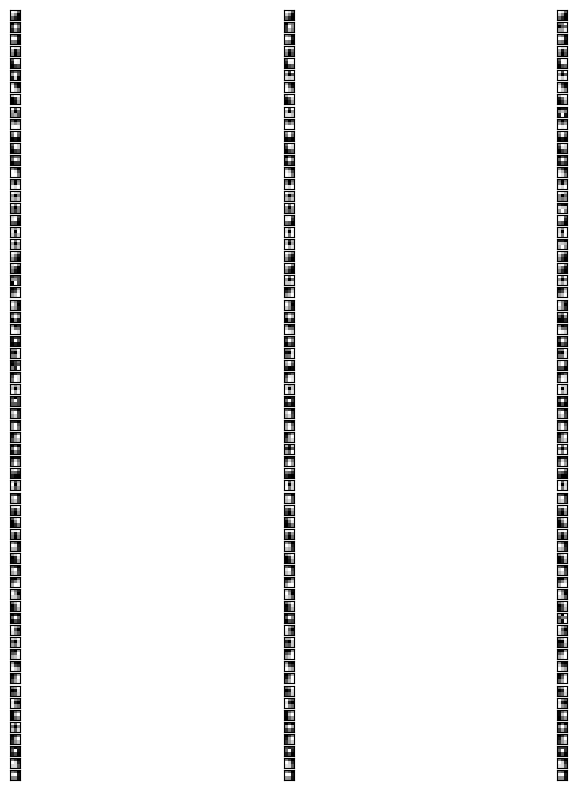

block1_conv2 (3, 3, 3, 64)
64


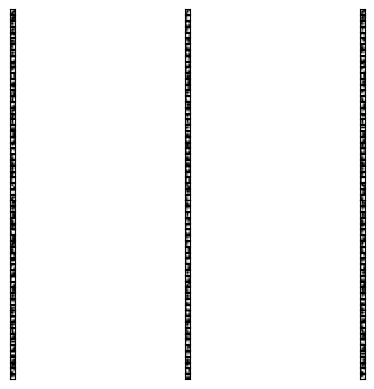

block2_conv1 (3, 3, 64, 64)
128


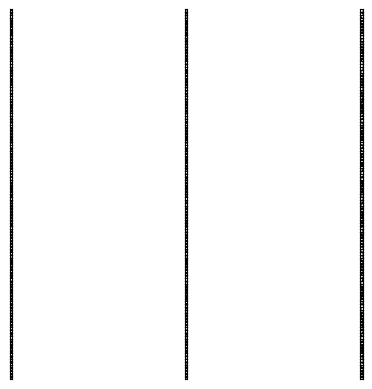

block2_conv2 (3, 3, 64, 128)
128


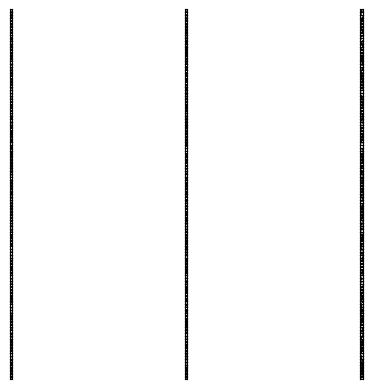

block3_conv1 (3, 3, 128, 128)
256


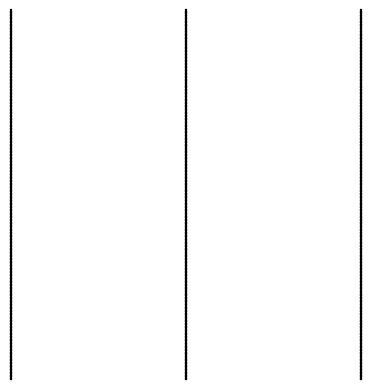

block3_conv2 (3, 3, 128, 256)
256


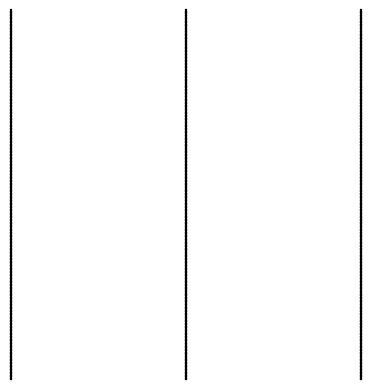

block3_conv3 (3, 3, 256, 256)
256


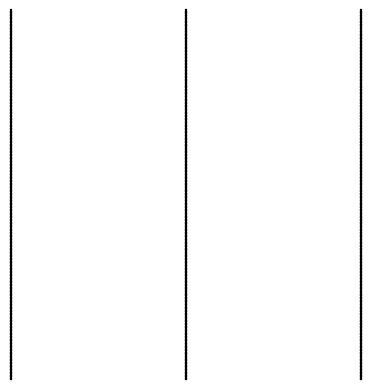

block4_conv1 (3, 3, 256, 256)
512


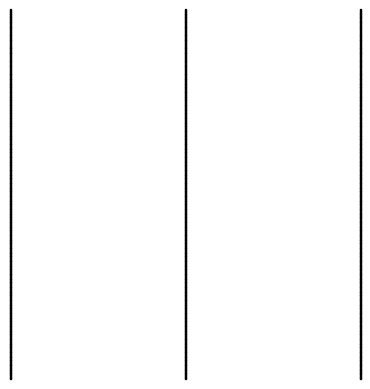

block4_conv2 (3, 3, 256, 512)
512


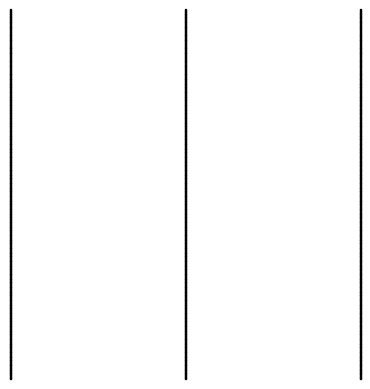

block4_conv3 (3, 3, 512, 512)
512


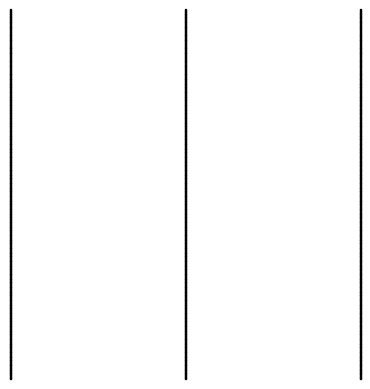

block5_conv1 (3, 3, 512, 512)
512


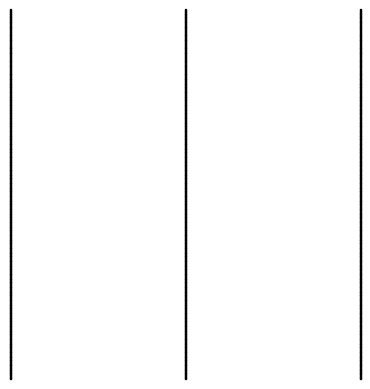

block5_conv2 (3, 3, 512, 512)
512


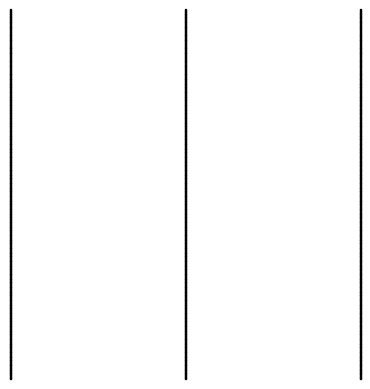

block5_conv3 (3, 3, 512, 512)
512


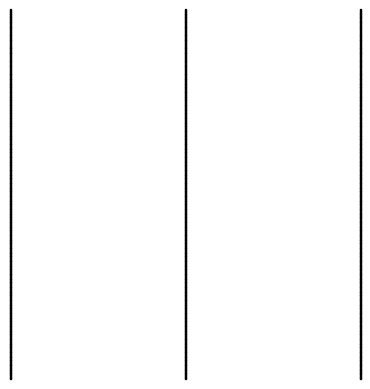

In [ ]:
fig = pyplot.figure(figsize=(10,10))
import matplotlib.pyplot as plt

#Iterate thru all the layers of the model
for layer in model.layers:
    if 'conv' in layer.name:
        weights, bias= layer.get_weights()
        print(layer.name, filters.shape)
        
        #normalize filter values between  0 and 1 for visualization
        f_min, f_max = weights.min(), weights.max()
        filters = (weights - f_min) / (f_max - f_min)  
        print(filters.shape[3])
        filter_cnt=1
        n_filters=filters.shape[3]
        ix=1
        for i in range(n_filters):
          # get the filter
          f = filters[:, :, :, i]
          # plot each channel separately
          
          for j in range(3):
            # specify subplot and turn of axis
            ax = pyplot.subplot(n_filters, 3, ix)
            ax.set_xticks([])
            ax.set_yticks([])
            # plot filter channel in grayscale
            pyplot.imshow(f[:, :, j], cmap='gray')
            ix += 1
        # show the figure
        pyplot.show()


#4- Image Visualization

# plot feature map of first conv layer for given image

In [ ]:

from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import preprocess_input
#from keras.preprocessing.image import load_img
from tensorflow.keras.utils import load_img
#from keras.preprocessing.image import img_to_array
from tensorflow.keras.utils import img_to_array
from keras.models import Model
from matplotlib import pyplot
from numpy import expand_dims

In [ ]:
model = Model(inputs=model.inputs , outputs=model.layers[1].output)

In [ ]:
image = load_img("/content/drive/MyDrive/Lab8&10/tree.jpg" , target_size=(224,224))

# convert the image to an array
image = img_to_array(image)
# expand dimensions so that it represents a single 'sample'
image = expand_dims(image, axis=0)

image = preprocess_input(image)

1/1 [==============================] - 0s 124ms/step


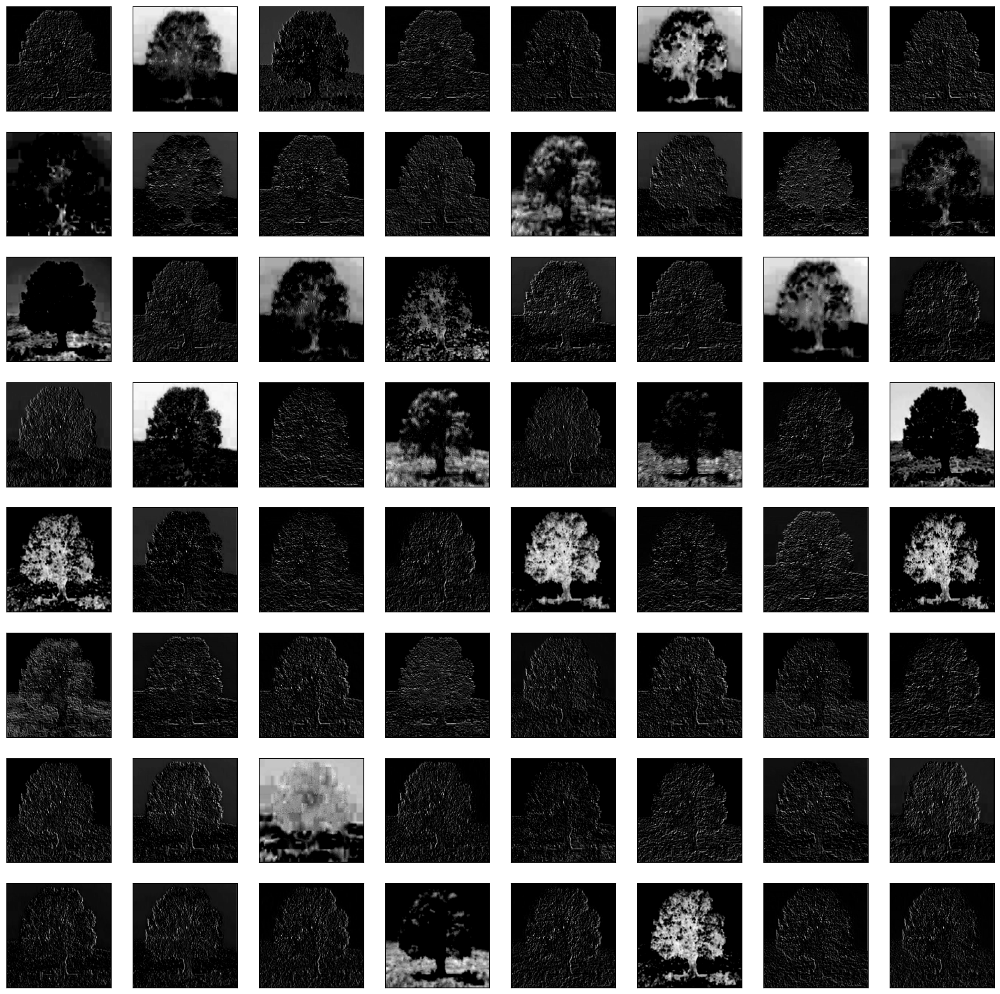

In [ ]:
#calculating features_map
features = model.predict(image)

fig = pyplot.figure(figsize=(20,20))
for i in range(1,features.shape[3]+1):

    ax =pyplot.subplot(8,8,i)
    ax.set_xticks([])
    ax.set_yticks([])
    pyplot.imshow(features[0,:,:,i-1] , cmap='gray')
    
pyplot.show()

# Plot feature map of layers 2,5,9,13,17 for given image

In [ ]:
model2 = VGG16()
layer_index = [ 2, 5 , 9 , 13 , 17]
outputs = [model2.layers[i].output for i in layer_index]

model3 = Model( inputs= model2.inputs, outputs = outputs)

1/1 [==============================] - 1s 691ms/step


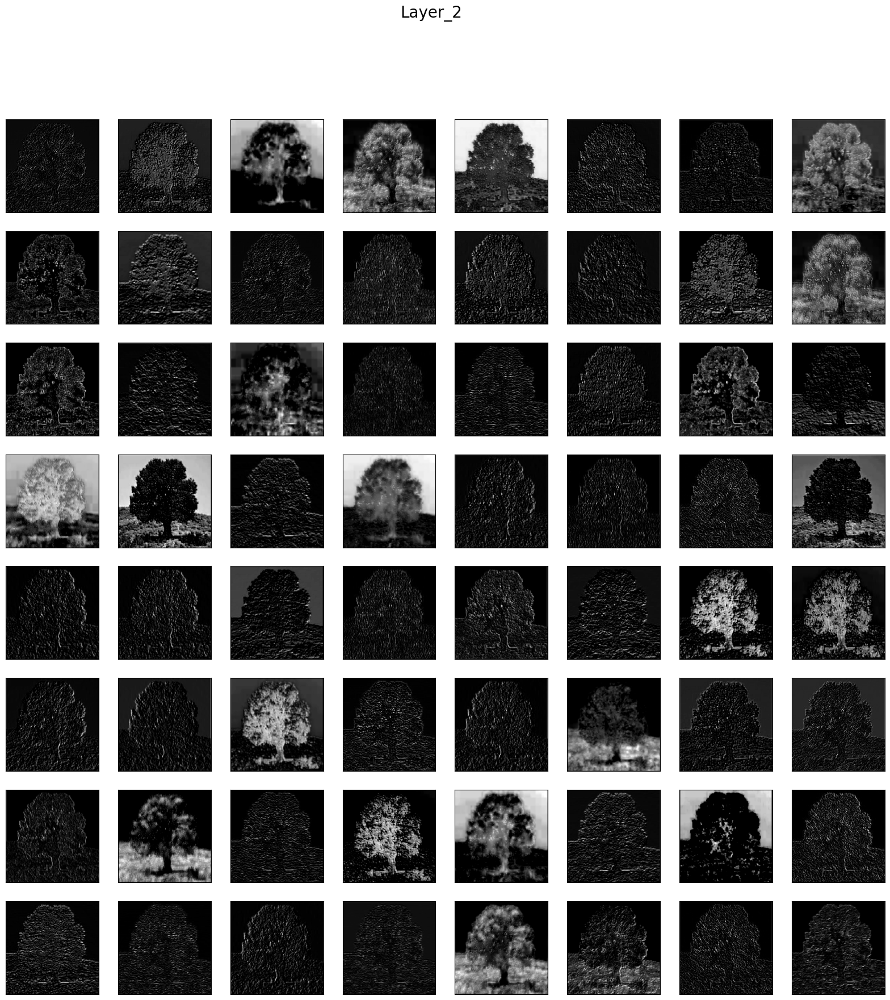

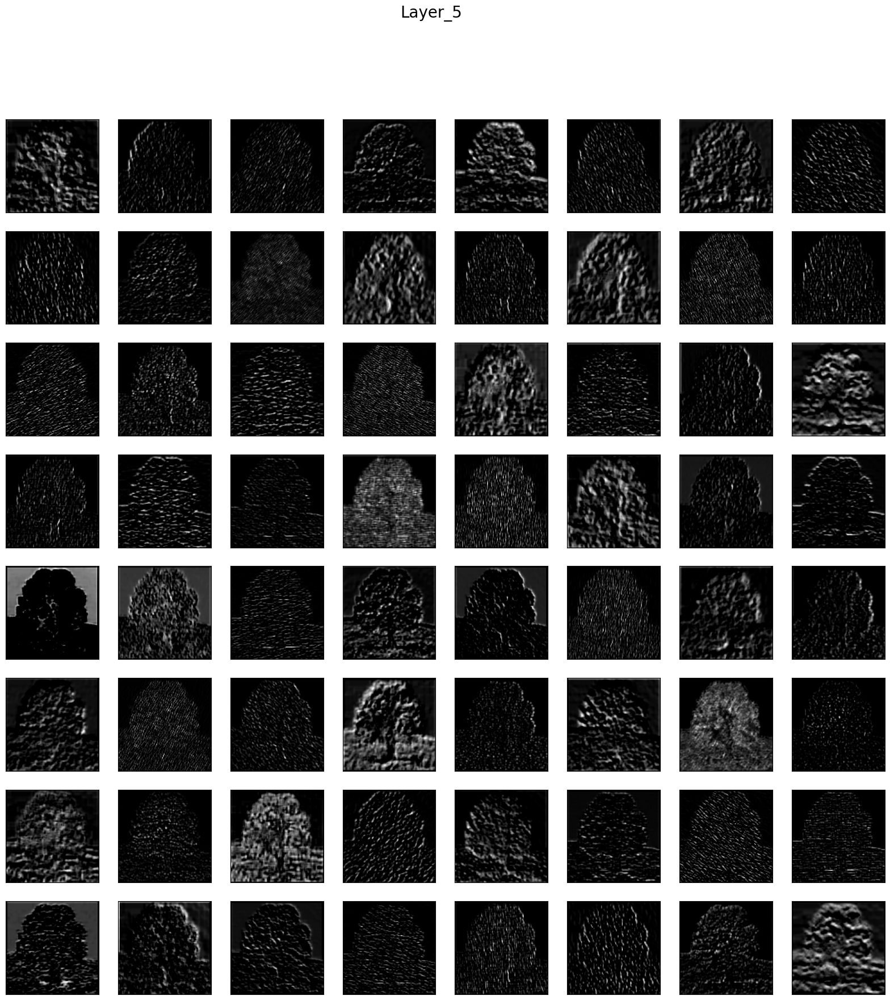

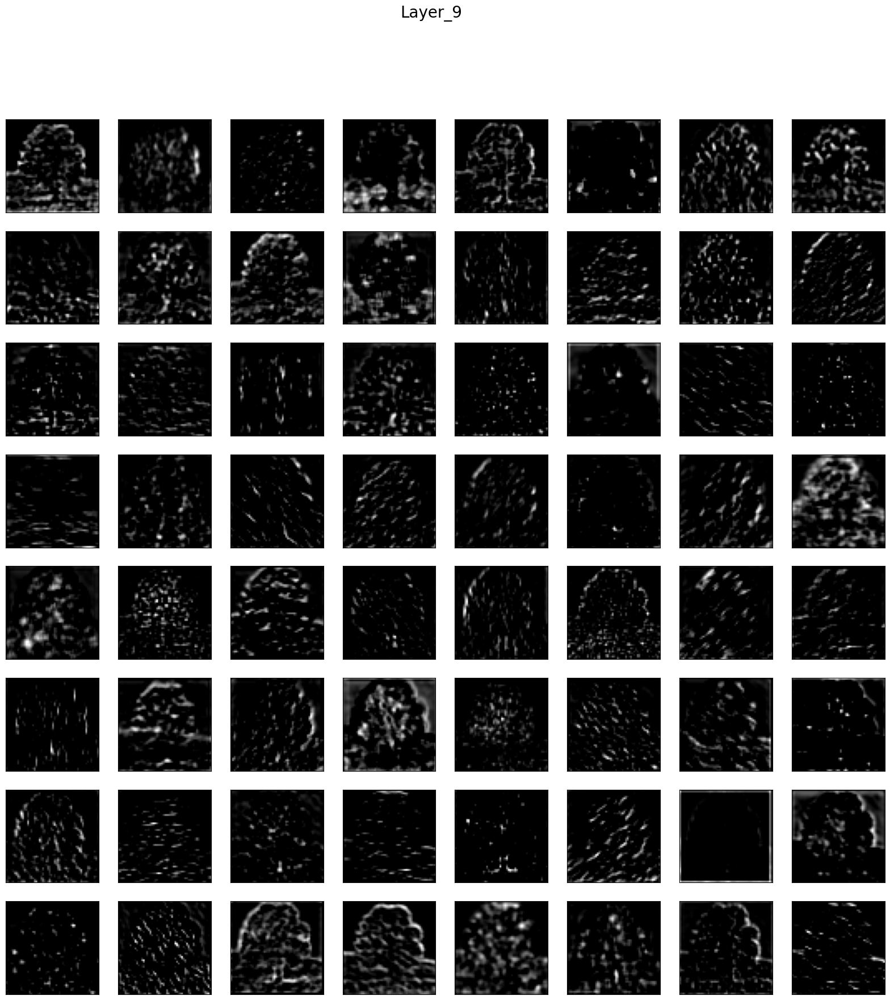

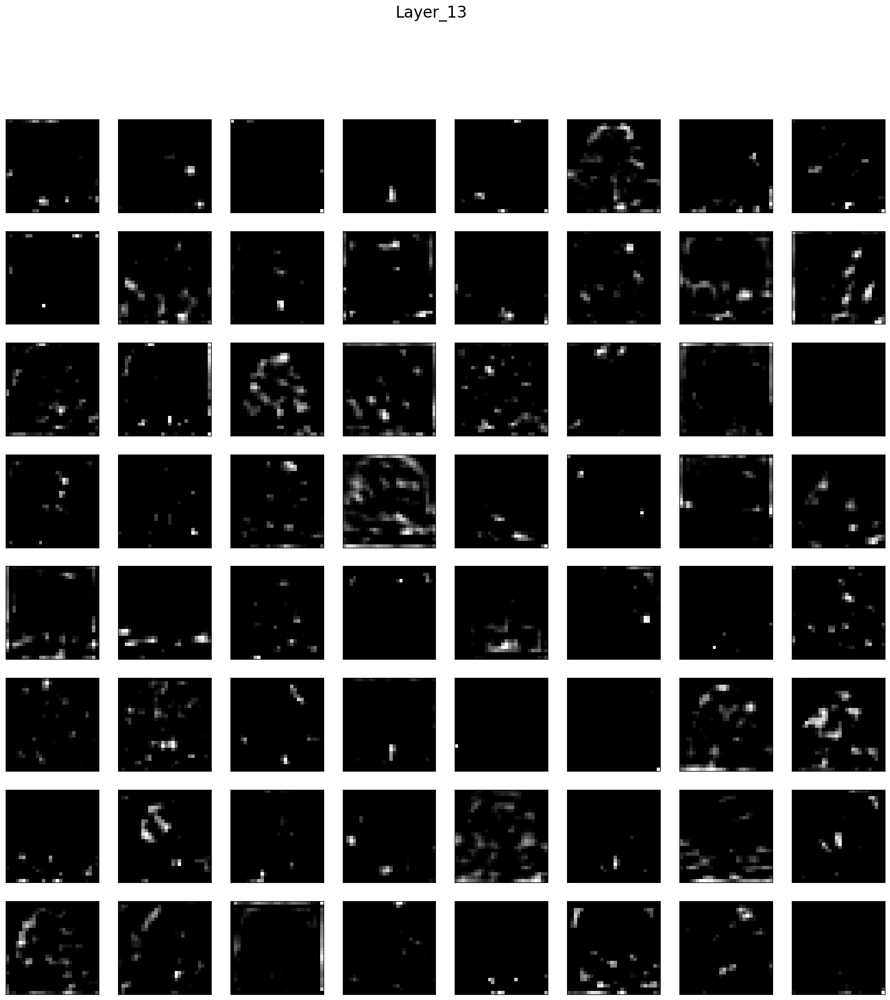

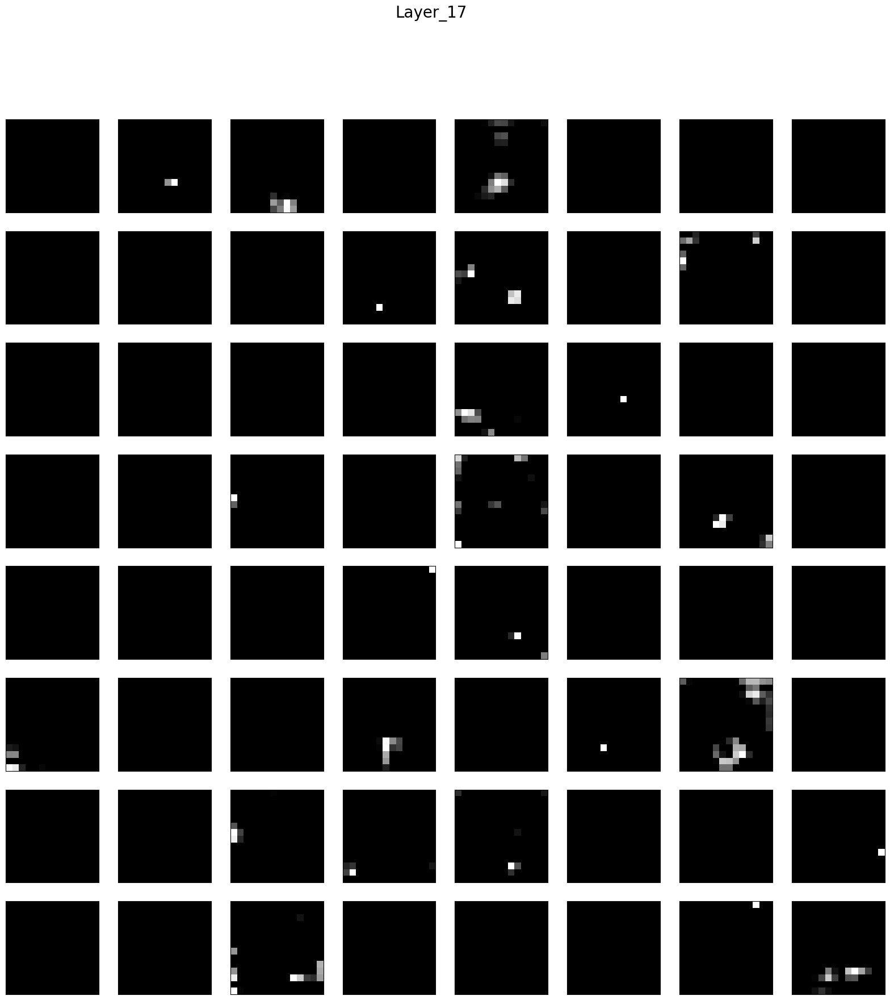

In [ ]:
feature_map = model3.predict(image)

for i,fmap in zip(layer_index,feature_map):
    fig = pyplot.figure(figsize=(20,20))
    fig.suptitle("Layer_{}".format(i) , fontsize=20)
    for i in range(1,features.shape[3]+1):

        ax=pyplot.subplot(8,8,i)
        ax.set_xticks([])
        ax.set_yticks([])
        pyplot.imshow(fmap[0,:,:,i-1] , cmap='gray')
    
pyplot.show()

#Obtain all intermediate representations for the image.

1/1 [==============================] - 1s 847ms/step
(1, 224, 224, 64)
(1, 224, 224, 64)
(1, 112, 112, 64)
(1, 112, 112, 128)
(1, 112, 112, 128)


<ipython-input-17-fddda308b579>:38: RuntimeWarning: invalid value encountered in true_divide
  x /= x.std ()


(1, 56, 56, 128)
(1, 56, 56, 256)
(1, 56, 56, 256)
(1, 56, 56, 256)
(1, 28, 28, 256)
(1, 28, 28, 512)
(1, 28, 28, 512)
(1, 28, 28, 512)
(1, 14, 14, 512)
(1, 14, 14, 512)
(1, 14, 14, 512)
(1, 14, 14, 512)
(1, 7, 7, 512)
(1, 25088)
(1, 4096)
(1, 4096)
(1, 1000)


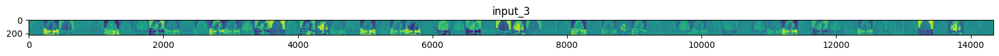

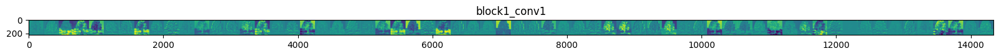

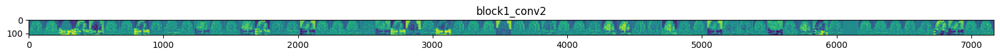

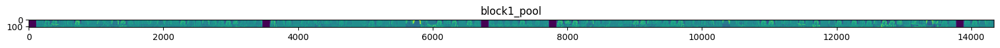

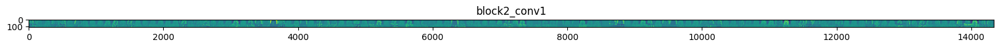

...

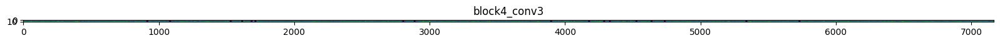

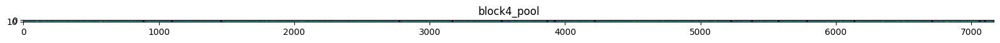

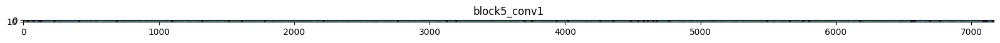

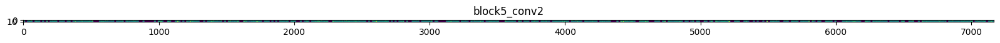

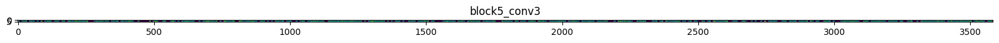

In [ ]:
import numpy as np
# load the model
model = VGG16()
# Define a new Model, Input= image 
# Output= intermediate representations for all layers in the  
# previous model after the first.
successive_outputs = [layer.output for layer in model.layers[1:]]
#visualization_model = Model(img_input, successive_outputs)
visualization_model =Model(inputs = model.input, outputs = successive_outputs)
#Load the input image
img = load_img('/content/drive/MyDrive/Lab8&10/tree.jpg', target_size=(224, 224))
# Convert ht image to Array of dimension (224,224,3)
x   = img_to_array(img)                           
x   = x.reshape((1,) + x.shape)
# Rescale by 1/255
x /= 255.0
# Let's run input image through our vislauization network
# to obtain all intermediate representations for the image.
successive_feature_maps = visualization_model.predict(x)
# Retrieve are the names of the layers, so can have them as part of our plot
layer_names = [layer.name for layer in model.layers]
for layer_name, feature_map in zip(layer_names, successive_feature_maps):
  print(feature_map.shape)
  if len(feature_map.shape) == 4:
    
    # Plot Feature maps for the conv / maxpool layers, not the fully-connected layers
   
    n_features = feature_map.shape[-1]  # number of features in the feature map
    size       = feature_map.shape[ 1]  # feature map shape (1, size, size, n_features)
    
    # We will tile our images in this matrix
    display_grid = np.zeros((size, size * n_features))
    
    # Postprocess the feature to be visually palatable
    for i in range(n_features):
      x  = feature_map[0, :, :, i]
      x -= x.mean()
      x /= x.std ()
      x *=  64
      x += 128
      x  = np.clip(x, 0, 255).astype('uint8')
      # Tile each filter into a horizontal grid
      display_grid[:, i * size : (i + 1) * size] = x
# Display the grid
    scale = 20. / n_features
    plt.figure( figsize=(scale * n_features, scale) )
    plt.title ( layer_name )
    plt.grid  ( False )
    plt.imshow( display_grid, aspect='auto', cmap='viridis' )
